# Why Spectral Indices Matter: Wildfire Burn Severity Analysis

In this notebook, we'll analyze a real wildfire and demonstrate why spectral indices are essential — they reveal information that's **impossible to see** in true color images.

**What we'll discover:**
1. True color shows "burned" vs "not burned" — but that's too simple
2. NBR (Normalized Burn Ratio) reveals a **gradient of severity**
3. dNBR (differenced NBR) quantifies **exactly how much damage** occurred
4. We can classify burn severity into actionable categories

**Why this matters:**
- Recovery efforts prioritize severely burned areas
- Erosion/flood risk depends on burn severity, not just "burned or not"
- Insurance claims need objective damage assessment
- Ecologists track how different severity zones recover over time

---
## 1. Setup

In [5]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

Connected to Planetary Computer


---
## 2. Select a Wildfire Location

We'll analyze the **2025 Palisades Fire** in Los Angeles — one of the most destructive fires in California history, devastating the Pacific Palisades neighborhood.

- **Started:** January 7, 2025
- **Contained:** Late January 2025
- **Location:** Pacific Palisades, Los Angeles

We'll compare imagery from **before** (December 2024) and **after** (late January 2025) the fire.

In [ ]:
# Palisades Fire area (Los Angeles, CA)
# Converting from lat,lon points to bbox [min_lon, min_lat, max_lon, max_lat]
fire_name = "Palisades Fire, Los Angeles"
bbox = [-118.559, 34.029, -118.472, 34.107]

# Time periods - extended post-fire range to find cloud-free imagery
pre_fire_date = "2024-12-01/2024-12-31"   # Before the fire
post_fire_date = "2025-01-15/2025-02-28"  # Extended range to find clear images

print(f"Location: {fire_name}")
print(f"Pre-fire period:  {pre_fire_date}")
print(f"Post-fire period: {post_fire_date}")

---
## 3. Helper Functions

In [7]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def compute_nbr(nir, swir2):
    """Compute Normalized Burn Ratio: (NIR - SWIR2) / (NIR + SWIR2)"""
    nir = nir.astype('float32')
    swir2 = swir2.astype('float32')
    return (nir - swir2) / (nir + swir2 + 1e-6)

def load_image(catalog, bbox, date_range, max_cloud=30):
    """Load a Sentinel-2 image for the given location and date range."""
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime=date_range,
        query={"eo:cloud_cover": {"lt": max_cloud}},
    )
    items = list(search.items())
    
    if len(items) == 0:
        # Try again with higher cloud tolerance
        print(f"  No images with <{max_cloud}% clouds. Trying with <50% clouds...")
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            bbox=bbox,
            datetime=date_range,
            query={"eo:cloud_cover": {"lt": 50}},
        )
        items = list(search.items())
    
    if len(items) == 0:
        raise ValueError(f"No images found for {date_range}")
    
    # Get clearest image
    items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
    item = items_sorted[0]
    
    signed_item = pc.sign(item)
    data = stac_load(
        [signed_item],
        bands=["B02", "B03", "B04", "B08", "B12"],
        bbox=bbox,
        crs="EPSG:4326",
        resolution=0.0002,
        groupby="solar_day",
    )
    
    return data, item

print("Helper functions defined.")

Helper functions defined.


---
## 4. Load Pre-Fire and Post-Fire Images

In [8]:
print("Loading pre-fire image...")
pre_data, pre_item = load_image(catalog, bbox, pre_fire_date)
print(f"  Date: {pre_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {pre_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(pre_data.dims)}")

print("\nLoading post-fire image...")
post_data, post_item = load_image(catalog, bbox, post_fire_date)
print(f"  Date: {post_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {post_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(post_data.dims)}")

# Show the bbox we're using
lon_range = bbox[2] - bbox[0]
lat_range = bbox[3] - bbox[1]
print(f"\nBbox: {bbox}")
print(f"  Longitude range: {lon_range:.4f}° ({lon_range*85:.1f} km at this latitude)")
print(f"  Latitude range: {lat_range:.4f}° ({lat_range*111:.1f} km)")

Loading pre-fire image...
  Date: 2024-12-18
  Cloud cover: 0.0%
  Data dimensions: {'latitude': 390, 'longitude': 435, 'time': 1}

Loading post-fire image...
  Date: 2025-02-21
  Cloud cover: 5.0%
  Data dimensions: {'latitude': 390, 'longitude': 435, 'time': 1}

Bbox: [-118.559, 34.029, -118.472, 34.107]
  Longitude range: 0.0870° (7.4 km at this latitude)
  Latitude range: 0.0780° (8.7 km)


---
## 5. Create True Color Images

Let's first look at what the human eye can see.

In [9]:
# Extract bands for pre-fire
pre_red = pre_data["B04"].isel(time=0).values
pre_green = pre_data["B03"].isel(time=0).values
pre_blue = pre_data["B02"].isel(time=0).values
pre_nir = pre_data["B08"].isel(time=0).values
pre_swir2 = pre_data["B12"].isel(time=0).values

# Extract bands for post-fire
post_red = post_data["B04"].isel(time=0).values
post_green = post_data["B03"].isel(time=0).values
post_blue = post_data["B02"].isel(time=0).values
post_nir = post_data["B08"].isel(time=0).values
post_swir2 = post_data["B12"].isel(time=0).values

# Create RGB composites
pre_rgb = normalize_for_display(np.stack([pre_red, pre_green, pre_blue], axis=-1))
post_rgb = normalize_for_display(np.stack([post_red, post_green, post_blue], axis=-1))

# Check the shape - this helps us understand the aspect ratio
print(f"Image shape: {pre_rgb.shape}")
print(f"  Height (rows): {pre_rgb.shape[0]}")
print(f"  Width (cols): {pre_rgb.shape[1]}")

# Calculate aspect ratio for proper display
img_height, img_width = pre_rgb.shape[:2]
aspect_ratio = img_width / img_height
print(f"  Aspect ratio (w/h): {aspect_ratio:.2f}")

Image shape: (390, 435, 3)
  Height (rows): 390
  Width (cols): 435
  Aspect ratio (w/h): 1.12


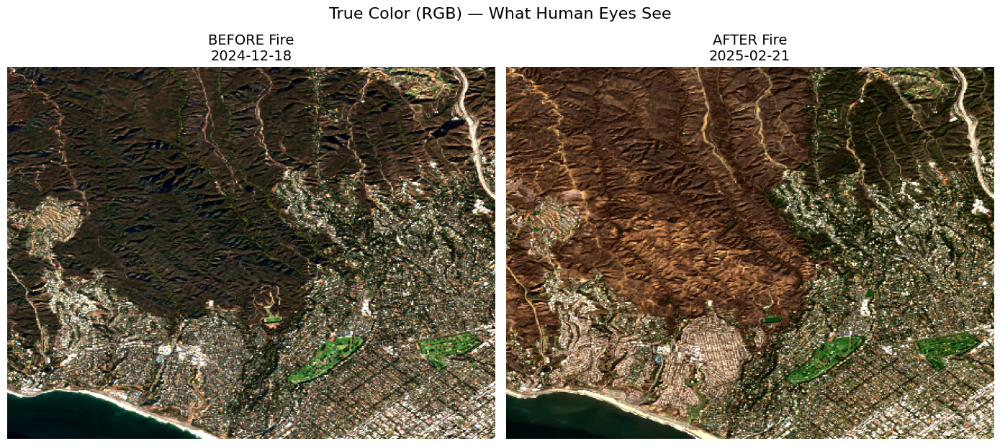

In [10]:
# Figure size based on image aspect ratio
img_height, img_width = pre_rgb.shape[:2]
aspect_ratio = img_width / img_height  # 1.67 for this image

# Each subplot should match the image aspect ratio
subplot_width = 7  # inches per subplot
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

axes[0].imshow(pre_rgb, aspect='auto')
axes[0].set_title(f"BEFORE Fire\n{pre_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

axes[1].imshow(post_rgb, aspect='auto')
axes[1].set_title(f"AFTER Fire\n{post_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("True Color (RGB) — What Human Eyes See", fontsize=16)
plt.tight_layout()
plt.show()

### What can you see?

In true color, you can see:
- **Dark/brown areas** — Obviously burned
- **Green areas** — Obviously not burned

But can you tell:
- Which burned areas are **severely** damaged vs **lightly** damaged?
- Which areas might recover quickly vs need decades?
- The exact **boundary** of the fire?

**No — it all just looks "burned."**

This is where spectral indices become essential.

---
## 6. Compute NBR (Normalized Burn Ratio)

NBR uses NIR and SWIR2 bands:
$$NBR = \frac{NIR - SWIR2}{NIR + SWIR2}$$

**Why it works:**
- Healthy vegetation: High NIR (cell structure), low SWIR2 → **High NBR**
- Burned areas: Low NIR (dead), high SWIR2 (charcoal absorbs NIR, reflects SWIR) → **Low NBR**

In [11]:
# Compute NBR for both dates
pre_nbr = compute_nbr(pre_nir, pre_swir2)
post_nbr = compute_nbr(post_nir, post_swir2)

print(f"Pre-fire NBR:  min={np.nanmin(pre_nbr):.2f}, max={np.nanmax(pre_nbr):.2f}, mean={np.nanmean(pre_nbr):.2f}")
print(f"Post-fire NBR: min={np.nanmin(post_nbr):.2f}, max={np.nanmax(post_nbr):.2f}, mean={np.nanmean(post_nbr):.2f}")

Pre-fire NBR:  min=-0.66, max=0.61, mean=0.15
Post-fire NBR: min=-0.71, max=0.61, mean=0.00


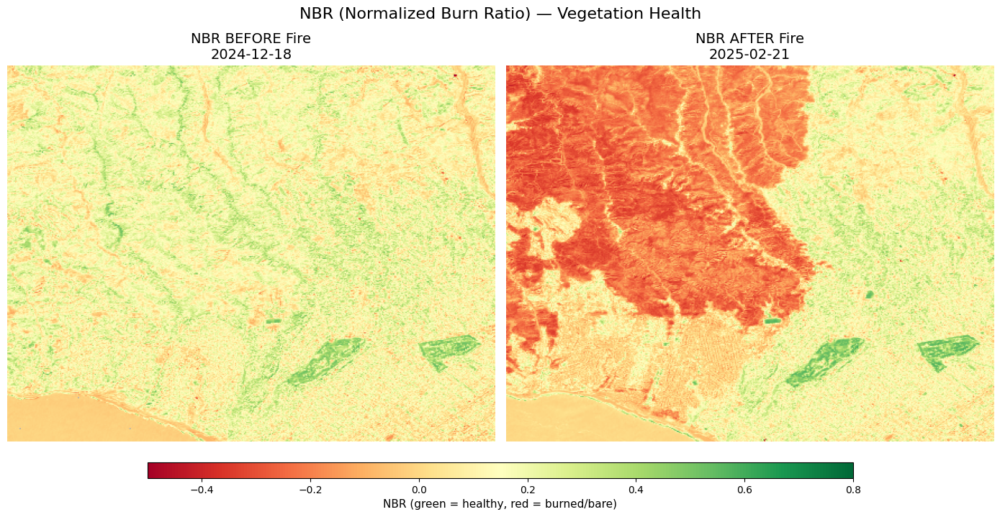

In [12]:
# Figure size based on image aspect ratio
img_height, img_width = pre_nbr.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height + 1))  # +1 for colorbar

im0 = axes[0].imshow(pre_nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.8, aspect='auto')
axes[0].set_title(f"NBR BEFORE Fire\n{pre_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

im1 = axes[1].imshow(post_nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.8, aspect='auto')
axes[1].set_title(f"NBR AFTER Fire\n{post_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("NBR (Normalized Burn Ratio) — Vegetation Health", fontsize=16)
plt.tight_layout()

cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NBR (green = healthy, red = burned/bare)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### What NBR reveals that true color doesn't:

Notice in the post-fire NBR:
- There's a **gradient** of reds and oranges — not just "burned"
- Some areas are **deeply red** (severely burned)
- Some areas are **orange/yellow** (moderately burned)
- You can see the **exact boundary** of the fire more clearly

But we can do even better...

---
## 7. Compute dNBR (Differenced NBR) — Burn Severity

The real power comes from **comparing** before and after:

$$dNBR = NBR_{pre} - NBR_{post}$$

**Interpretation:**
- **High positive dNBR:** Big drop in NBR → Severe burn
- **Low positive dNBR:** Small drop → Light burn
- **Near zero:** No change
- **Negative:** Regrowth (unusual in short timeframe)

In [13]:
# Compute dNBR (differenced NBR)
dnbr = pre_nbr - post_nbr

print(f"dNBR statistics:")
print(f"  Min: {np.nanmin(dnbr):.2f}")
print(f"  Max: {np.nanmax(dnbr):.2f}")
print(f"  Mean: {np.nanmean(dnbr):.2f}")

# What percentage of area was burned?
burned_pixels = np.sum(dnbr > 0.1)  # Threshold for "burned"
total_pixels = dnbr.size
print(f"\nApprox. burned area: {100 * burned_pixels / total_pixels:.1f}% of image")

dNBR statistics:
  Min: -0.62
  Max: 0.91
  Mean: 0.15

Approx. burned area: 45.9% of image


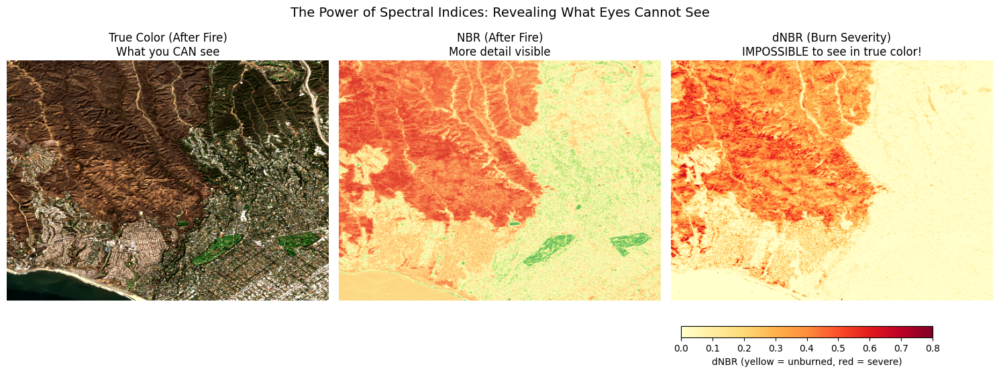

In [14]:
# Figure size for 3 subplots
img_height, img_width = dnbr.shape
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 3, figsize=(subplot_width * 3, subplot_height + 1))

# True color post-fire
axes[0].imshow(post_rgb, aspect='auto')
axes[0].set_title("True Color (After Fire)\nWhat you CAN see", fontsize=12)
axes[0].axis('off')

# NBR post-fire
im1 = axes[1].imshow(post_nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.8, aspect='auto')
axes[1].set_title("NBR (After Fire)\nMore detail visible", fontsize=12)
axes[1].axis('off')

# dNBR - burn severity
im2 = axes[2].imshow(dnbr, cmap='YlOrRd', vmin=0, vmax=0.8, aspect='auto')
axes[2].set_title("dNBR (Burn Severity)\nIMPOSSIBLE to see in true color!", fontsize=12)
axes[2].axis('off')

plt.suptitle("The Power of Spectral Indices: Revealing What Eyes Cannot See", fontsize=14)
plt.tight_layout()

cbar_ax = fig.add_axes([0.68, 0.08, 0.25, 0.03])
cbar = fig.colorbar(im2, cax=cbar_ax, orientation='horizontal')
cbar.set_label('dNBR (yellow = unburned, red = severe)', fontsize=10)
plt.subplots_adjust(bottom=0.18)
plt.show()

### 🔥 This is what you CANNOT see in true color!

The dNBR map shows **burn severity as a gradient**:
- **Dark red:** Severely burned — total vegetation loss, soil damage
- **Orange:** Moderately burned — significant damage
- **Light orange/yellow:** Lightly burned — minor damage, will recover quickly
- **White/cream:** Unburned

In true color, it all just looks "brown" — but dNBR reveals:
- **WHERE** the most severe damage occurred
- **EXACTLY** how much the vegetation health dropped
- A **quantifiable number** for every pixel

---
## 8. Classify Burn Severity

Now let's turn dNBR into **actionable categories** using standard USGS thresholds:

In [15]:
# USGS burn severity classification thresholds
# Based on Key & Benson (2006)

def classify_burn_severity(dnbr):
    """
    Classify burn severity using standard USGS thresholds.
    Returns integer classes: 0=unburned, 1=low, 2=moderate-low, 3=moderate-high, 4=high
    """
    severity = np.zeros_like(dnbr, dtype=np.int8)
    
    severity[dnbr < 0.1] = 0   # Unburned/very low
    severity[(dnbr >= 0.1) & (dnbr < 0.27)] = 1   # Low severity
    severity[(dnbr >= 0.27) & (dnbr < 0.44)] = 2  # Moderate-low severity
    severity[(dnbr >= 0.44) & (dnbr < 0.66)] = 3  # Moderate-high severity
    severity[dnbr >= 0.66] = 4  # High severity
    
    return severity

severity_map = classify_burn_severity(dnbr)

# Count pixels in each class
print("Burn Severity Classification:")
print("-" * 50)
severity_names = ['Unburned', 'Low', 'Moderate-Low', 'Moderate-High', 'High']
for i, name in enumerate(severity_names):
    count = np.sum(severity_map == i)
    pct = 100 * count / severity_map.size
    print(f"  {name:15s}: {pct:5.3f}% of area")

Burn Severity Classification:
--------------------------------------------------
  Unburned       : 54.132% of area
  Low            : 13.946% of area
  Moderate-Low   : 22.295% of area
  Moderate-High  : 9.493% of area
  High           : 0.134% of area


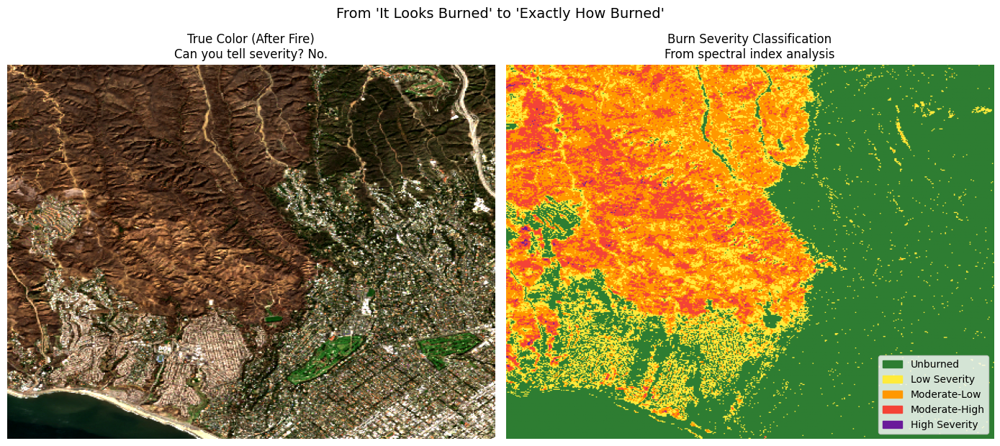

In [16]:
# Create a custom colormap for severity classes
colors = ['#2E7D32', '#FFEB3B', '#FF9800', '#F44336', '#6A1B9A']  # Green, Yellow, Orange, Red, Purple
cmap_severity = ListedColormap(colors)
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(bounds, cmap_severity.N)

# Figure size based on aspect ratio
img_height, img_width = severity_map.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

# True color
axes[0].imshow(post_rgb, aspect='auto')
axes[0].set_title("True Color (After Fire)\nCan you tell severity? No.", fontsize=12)
axes[0].axis('off')

# Classified severity map
im = axes[1].imshow(severity_map, cmap=cmap_severity, norm=norm, aspect='auto')
axes[1].set_title("Burn Severity Classification\nFrom spectral index analysis", fontsize=12)
axes[1].axis('off')

# Add legend
patches = [
    mpatches.Patch(color=colors[0], label='Unburned'),
    mpatches.Patch(color=colors[1], label='Low Severity'),
    mpatches.Patch(color=colors[2], label='Moderate-Low'),
    mpatches.Patch(color=colors[3], label='Moderate-High'),
    mpatches.Patch(color=colors[4], label='High Severity'),
]
axes[1].legend(handles=patches, loc='lower right', fontsize=10)

plt.suptitle("From 'It Looks Burned' to 'Exactly How Burned'", fontsize=14)
plt.tight_layout()
plt.show()

---
## 9. Why This Matters: Real-World Applications

This classified map is **actionable information** that true color cannot provide:

In [ ]:
# Calculate approximate areas (assuming ~20m resolution)
pixel_area_hectares = 0.04  # Approximate hectares per pixel at this resolution

print("="*60)
print("BURN SEVERITY REPORT")
print("="*60)
print(f"Fire: {fire_name}")
print(f"Analysis date: {post_item.datetime.strftime('%Y-%m-%d')}")
print("="*60)
print("\nSeverity Breakdown:")
print("-"*60)

for i, name in enumerate(severity_names):
    count = np.sum(severity_map == i)
    pct = 100 * count / severity_map.size
    area = count * pixel_area_hectares
    
    if i == 0:
        action = "No action needed"
    elif i == 1:
        action = "Monitor for natural recovery"
    elif i == 2:
        action = "Consider erosion control"
    elif i == 3:
        action = "Active restoration recommended"
    else:
        action = "PRIORITY: Immediate intervention needed"
    
    print(f"\n{name}:")
    print(f"  Coverage: {pct:.1f}% (~{area:.0f} hectares)")
    print(f"  Action:   {action}")

print("\n" + "="*60)
print("This report was generated automatically from satellite data.")
print("No human needed to visually inspect the burn area!")
print("="*60)

---
## 10. Full Comparison: True Color vs Index Analysis

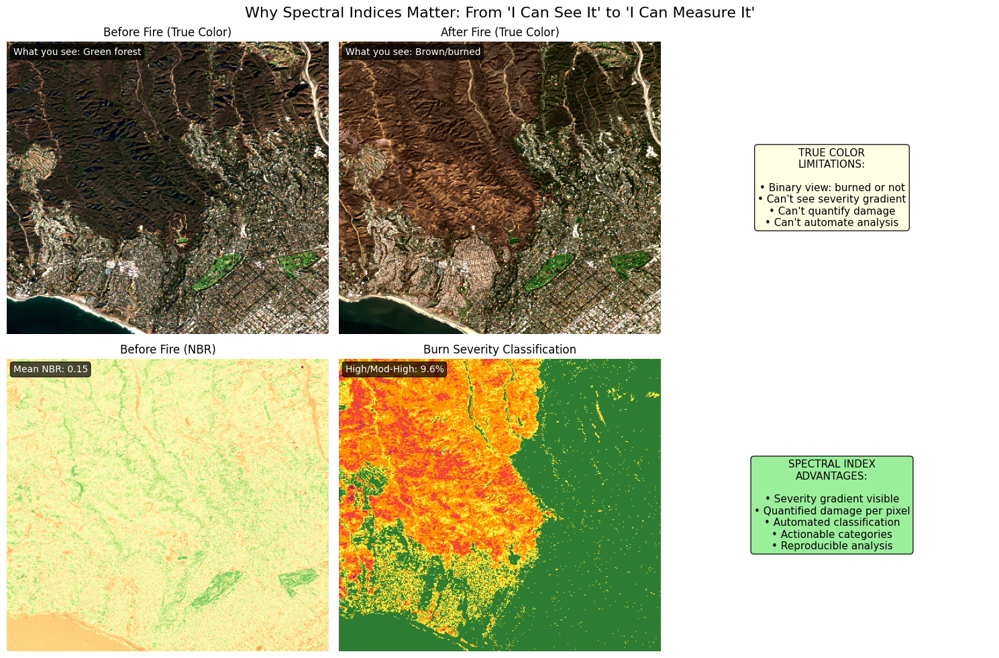

In [18]:
# Figure size for 2x3 grid based on image aspect ratio
img_height, img_width = pre_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(2, 3, figsize=(subplot_width * 3, subplot_height * 2 + 1))

# Row 1: True Color
axes[0, 0].imshow(pre_rgb, aspect='auto')
axes[0, 0].set_title("Before Fire (True Color)", fontsize=12)
axes[0, 0].axis('off')
axes[0, 0].text(0.02, 0.98, "What you see: Green forest", transform=axes[0, 0].transAxes,
                fontsize=10, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

axes[0, 1].imshow(post_rgb, aspect='auto')
axes[0, 1].set_title("After Fire (True Color)", fontsize=12)
axes[0, 1].axis('off')
axes[0, 1].text(0.02, 0.98, "What you see: Brown/burned", transform=axes[0, 1].transAxes,
                fontsize=10, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

axes[0, 2].axis('off')
axes[0, 2].text(0.5, 0.5, "TRUE COLOR\nLIMITATIONS:\n\n• Binary view: burned or not\n• Can't see severity gradient\n• Can't quantify damage\n• Can't automate analysis",
                transform=axes[0, 2].transAxes, fontsize=11, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))

# Row 2: Index Analysis
im_pre = axes[1, 0].imshow(pre_nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.8, aspect='auto')
axes[1, 0].set_title("Before Fire (NBR)", fontsize=12)
axes[1, 0].axis('off')
axes[1, 0].text(0.02, 0.98, f"Mean NBR: {np.nanmean(pre_nbr):.2f}", transform=axes[1, 0].transAxes,
                fontsize=10, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

im_sev = axes[1, 1].imshow(severity_map, cmap=cmap_severity, norm=norm, aspect='auto')
axes[1, 1].set_title("Burn Severity Classification", fontsize=12)
axes[1, 1].axis('off')
high_sev_pct = 100 * np.sum(severity_map >= 3) / severity_map.size
axes[1, 1].text(0.02, 0.98, f"High/Mod-High: {high_sev_pct:.1f}%", transform=axes[1, 1].transAxes,
                fontsize=10, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

axes[1, 2].axis('off')
axes[1, 2].text(0.5, 0.5, "SPECTRAL INDEX\nADVANTAGES:\n\n• Severity gradient visible\n• Quantified damage per pixel\n• Automated classification\n• Actionable categories\n• Reproducible analysis",
                transform=axes[1, 2].transAxes, fontsize=11, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))

plt.suptitle("Why Spectral Indices Matter: From 'I Can See It' to 'I Can Measure It'", fontsize=16)
plt.tight_layout()
plt.show()

---
## Summary: Why Spectral Indices Matter

### What human eyes see:
- "It's burned" or "It's not burned"
- Binary, subjective assessment
- Cannot be automated

### What spectral indices reveal:
- **Severity gradient** from unburned to severely burned
- **Quantified values** for every pixel
- **Automatic classification** into actionable categories
- **Reproducible analysis** anyone can verify

### Real-world impact:

| Application | How indices help |
|-------------|------------------|
| Emergency response | Prioritize severely burned areas |
| Erosion control | Target moderate-high severity zones |
| Reforestation | Plan planting based on severity |
| Insurance | Objective damage assessment |
| Research | Track recovery rates by severity class |
| Policy | Quantify total damage for disaster declarations |

**The key insight:** Spectral indices don't just show us things — they **measure** things. And what can be measured can be tracked, compared, and acted upon at scale.